# License plate recognition

## Objectives

The goal of this challenge is to implement a video surveillance application capable of recognizing the license plates of vehicles appearing in a video sequence.

License plates serve as a unique identifier for vehicles, so being able to recognize them is a fundamental component in any traffic analysis application and in Smart City applications.

## Environment Setup

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data, io, filters, transform
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray
from skimage.measure import label
from skimage.util import invert
from skimage.measure import regionprops
from ipywidgets import interactive, IntSlider, FloatSlider

import warnings
warnings.filterwarnings("ignore")

We load a few auxiliary functions, which you can see in the ocr.py file.

In [2]:
from ocr import mostrar_blobs, mostrar_rois, mostrar_frames
from ocr import extraer_limites, genera_dataset, carga_dataset, extraer_ventana, dibujar_matches

### Dataset 

In this case, we are going to use some images from a dataset provided by the University of Zagreb (http://www.zemris.fer.hr/projects/LicensePlates/english/results.shtml). The images are located in the dataset folder.

The first step we will take is to load them:

In [3]:
dataset_rgb = io.ImageCollection('dataset/*.jpg')
print("Cargadas {} instancias.".format(len(dataset_rgb)))

Cargadas 8 instancias.


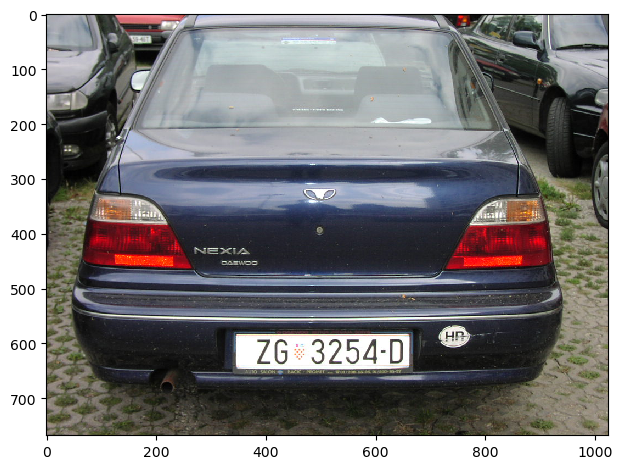

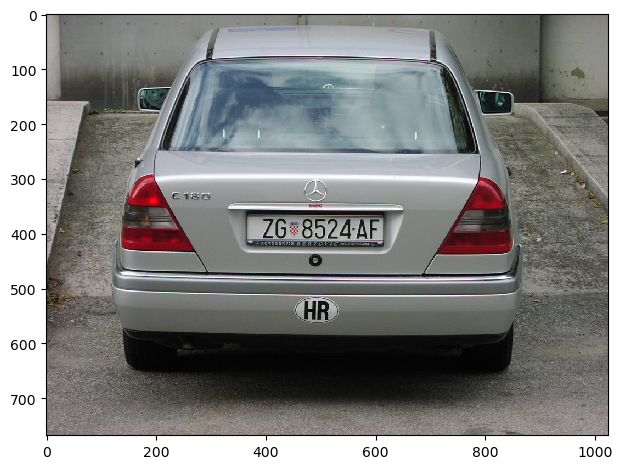

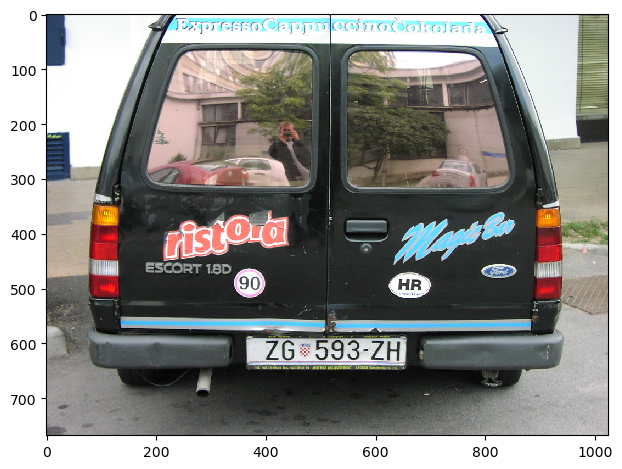

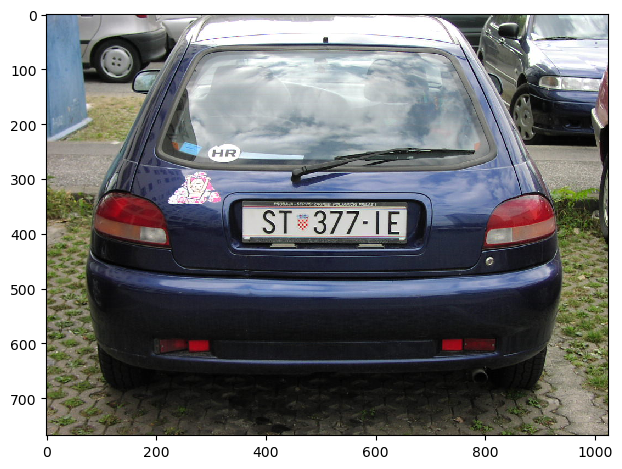

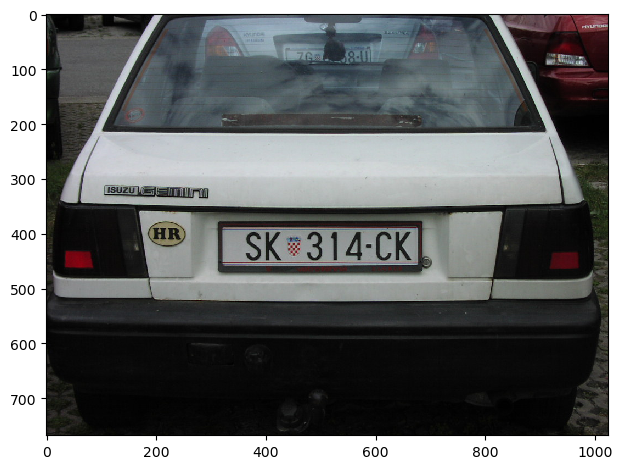

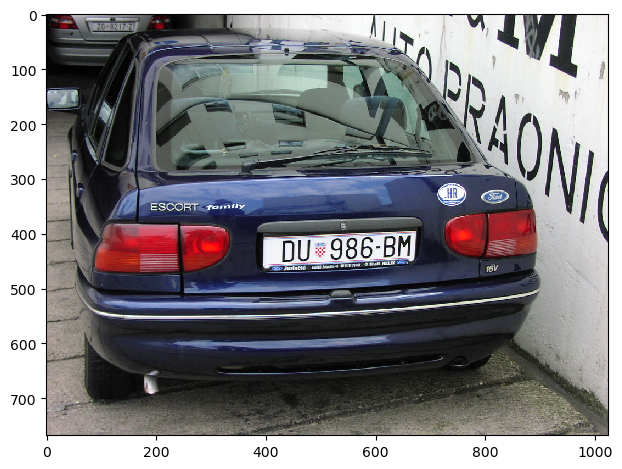

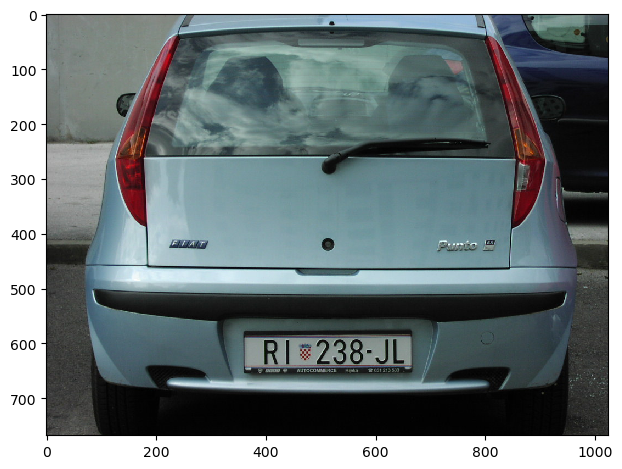

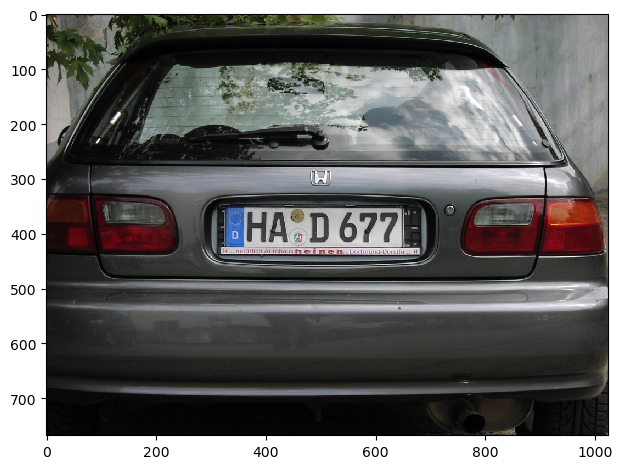

In [4]:
mostrar_frames(dataset_rgb)

Conversion to Grayscale

The next step is to convert the images from their original RGB color space to grayscale:

In [5]:
from skimage.color import rgb2gray

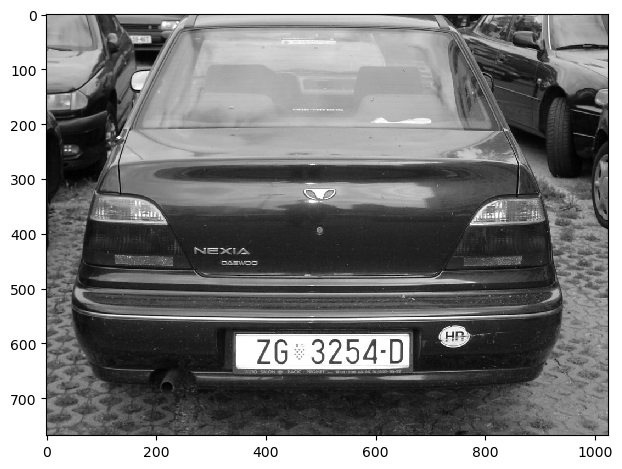

In [6]:
io.imshow(rgb2gray(dataset_rgb[0]))

In [7]:
def convierte_a_gris_frames(imgs):
    """Function that receives a list of frames and returns another 
    list of frames converted to grayscale."""
    
    out = []
    
    for image in imgs:
        out.append(rgb2gray(image))

    return out

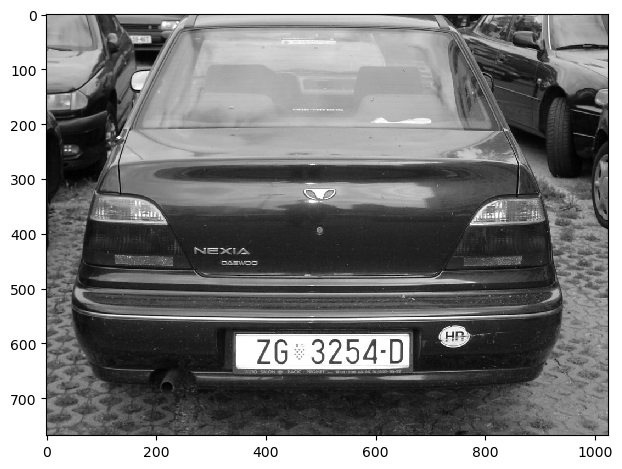

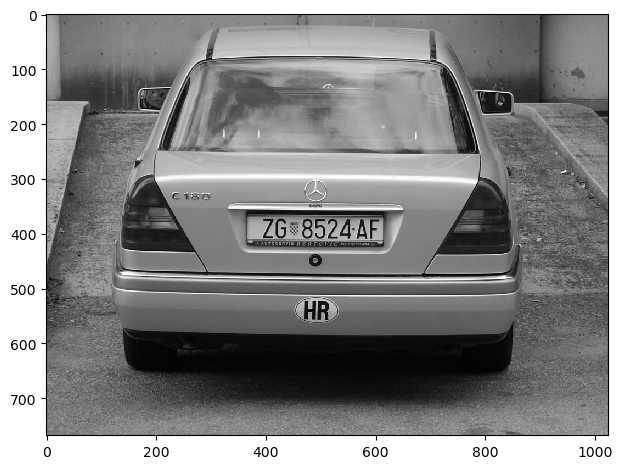

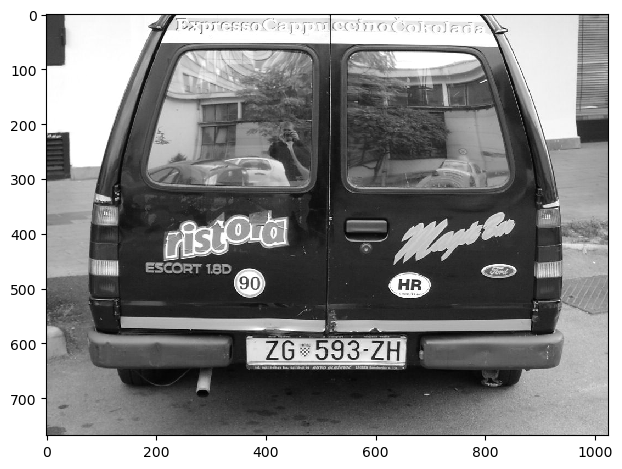

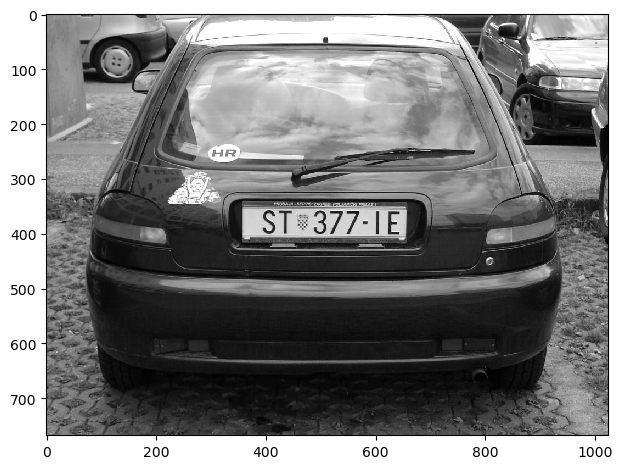

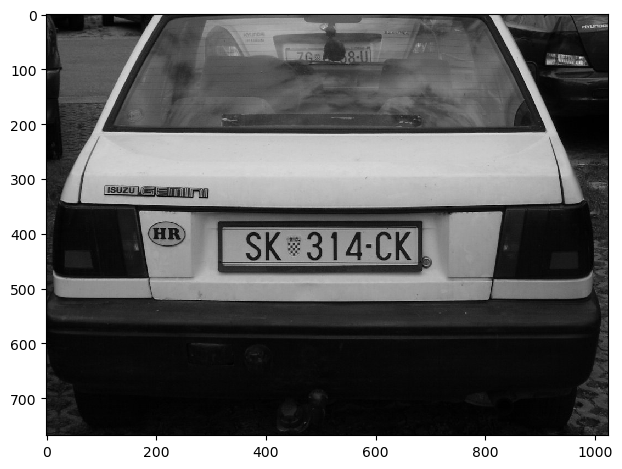

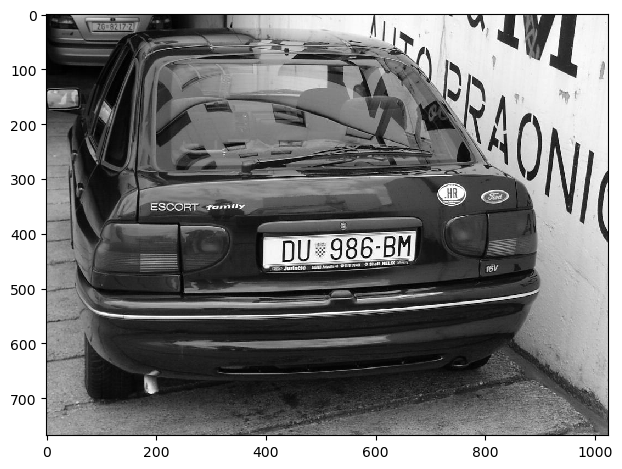

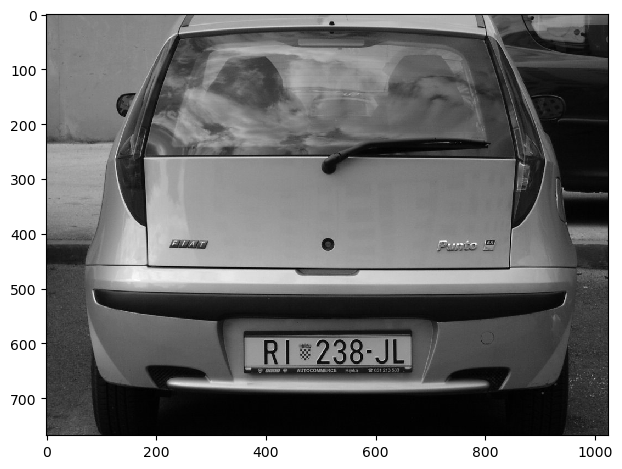

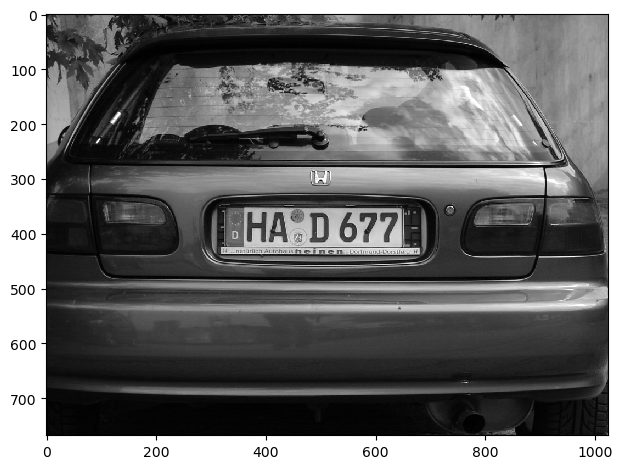

In [8]:
dataset_gris = convierte_a_gris_frames(dataset_rgb)
mostrar_frames(dataset_gris)

## Binarization

Once the images are converted to grayscale, we are going to binarize them:

In [9]:
from skimage.filters import threshold_otsu

In [10]:
from skimage import  util

In [11]:
def binariza_frames(imgs):
    """Function that receives a list of grayscale frames and converts them to monochrome."""
    out = []
    
    # For loop each frame
    for image in imgs:
        umbral = threshold_otsu(image)
        imagen_mono = image > (umbral)
        out.append(imagen_mono.astype(float))

    return out

In [12]:
dataset_gris[0].shape

(768, 1024)

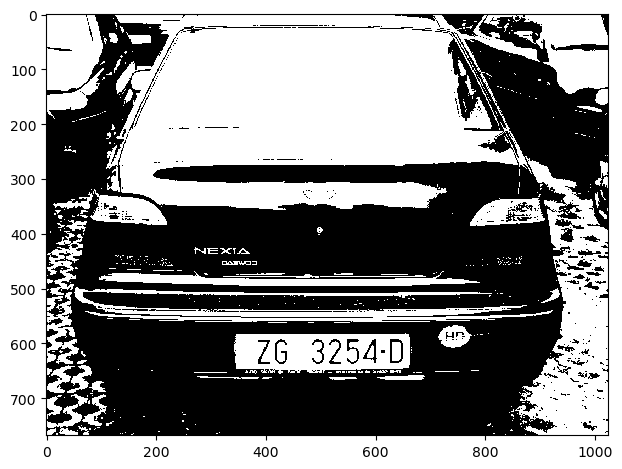

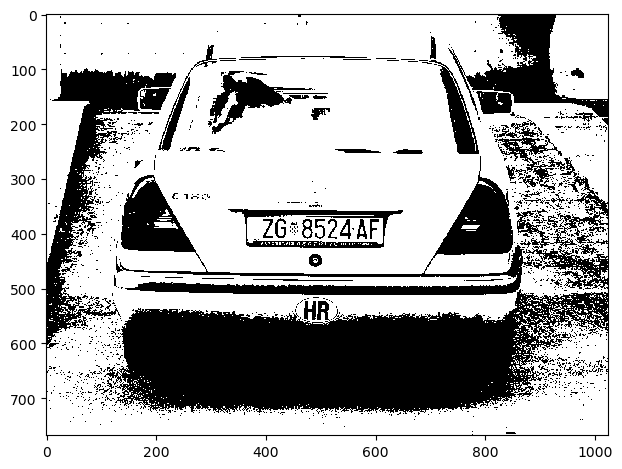

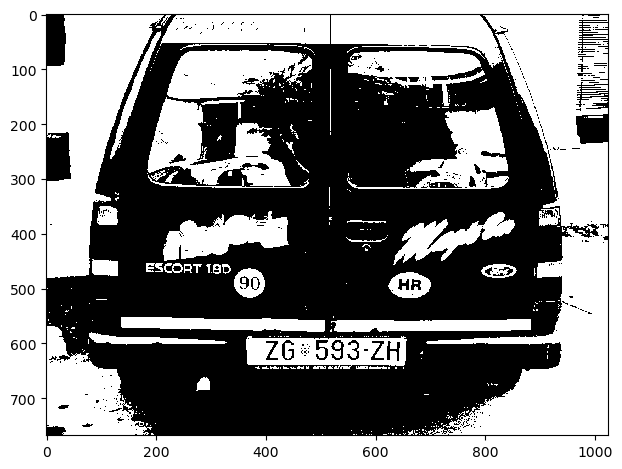

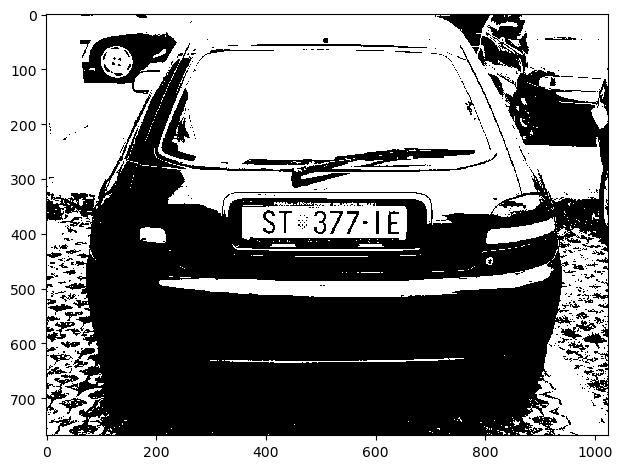

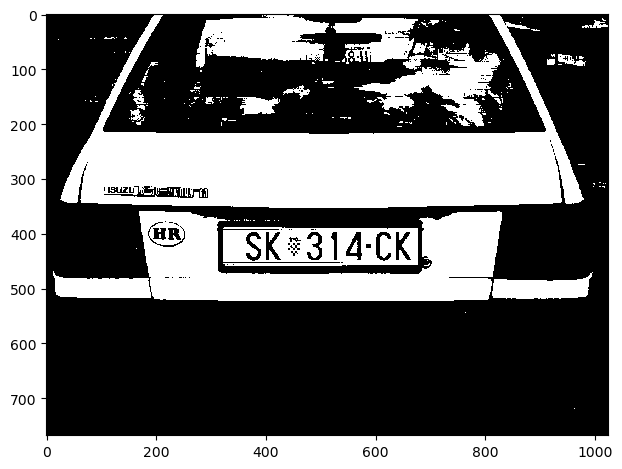

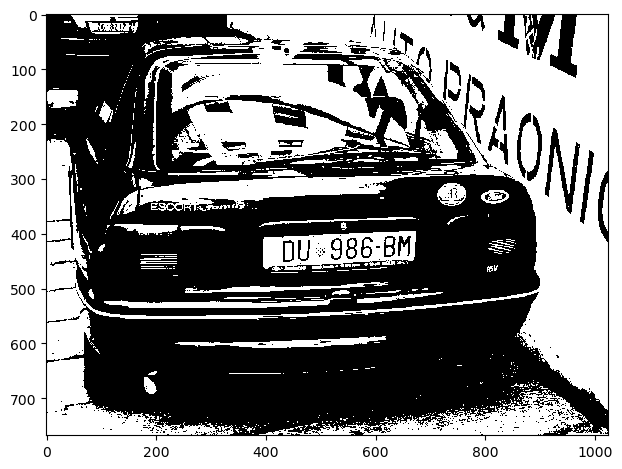

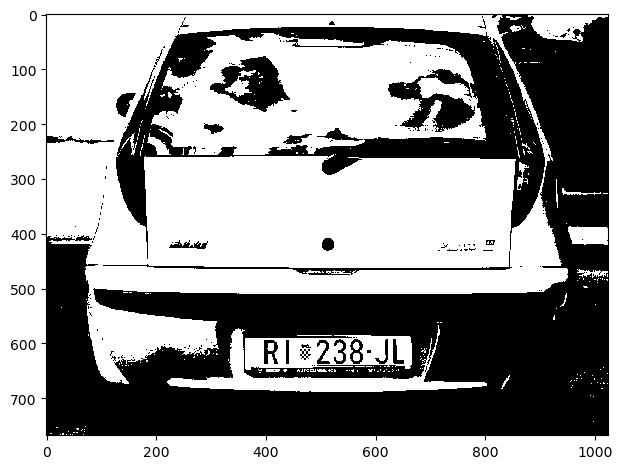

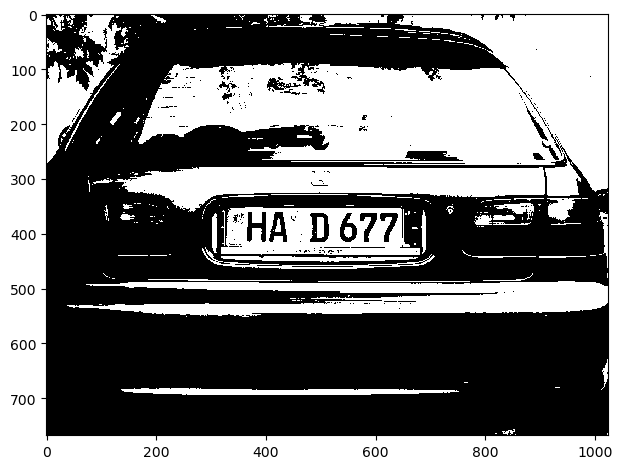

In [13]:
dataset_mono = binariza_frames(dataset_gris)
mostrar_frames(dataset_mono)

## Segmentation

Once binarized, we are ready to perform segmentation (character identification):

In [14]:
from skimage.measure import label, regionprops
from ocr import mostrar_rois
from skimage import io, measure, util
import matplotlib.pyplot as plt

In [15]:
image = dataset_gris[0]
umbral = threshold_otsu(image)
imagen_mono = image > (umbral)


In [16]:
util.invert(imagen_mono)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ...,  True,  True,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

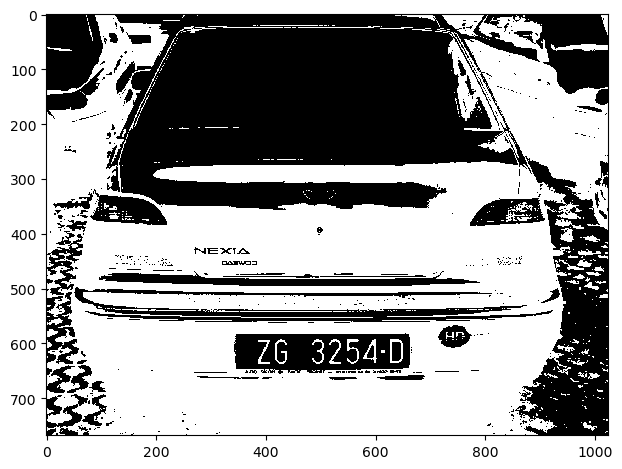

In [17]:
io.imshow(util.invert(imagen_mono))

In [18]:

def extraccion_de_rois(imgs, debug=False):
    """
    Receives a list of monochrome images and returns a list of regions of interest (ROIs).
    If debug is True, it displays each image with the extracted ROIs.

    Args:
    imgs (list): List of images in NumPy array format.
    debug (bool): If True, displays the processed images with labeled ROIs.

    Returns:
    list: List of images with labeled ROIs.
    """
    
    out = []

    for image in imgs:
        # Label connected regions
        img_labeled = measure.label(image, background=1)    # background = 1 informs that the background label will be pixels with value 1
        rois = regionprops(img_labeled)
        out.append(rois)

        if debug:
            # Display the labeled image
            mostrar_rois(image, rois)
            plt.show()  # Necessary for the image to be shown

    return out


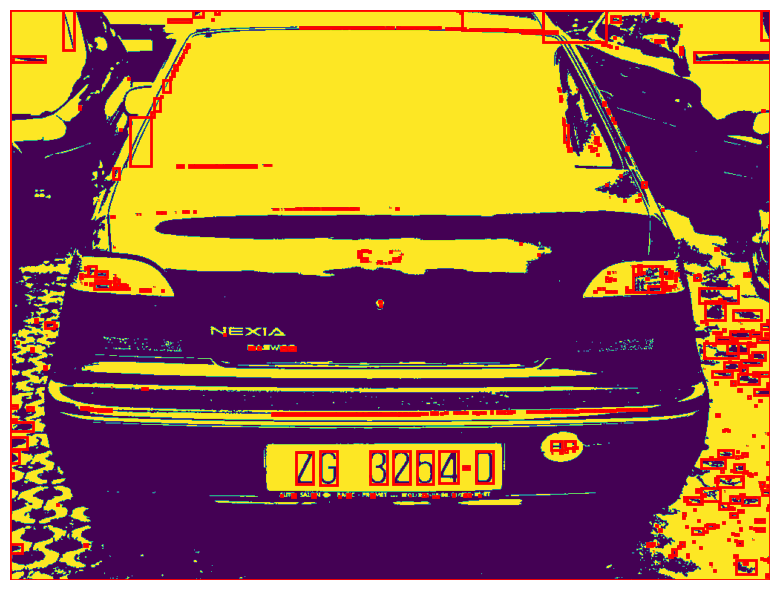

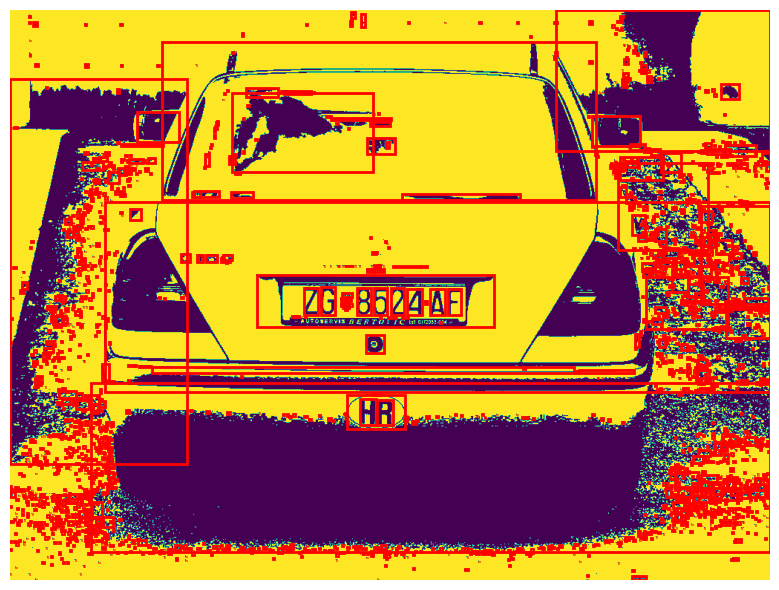

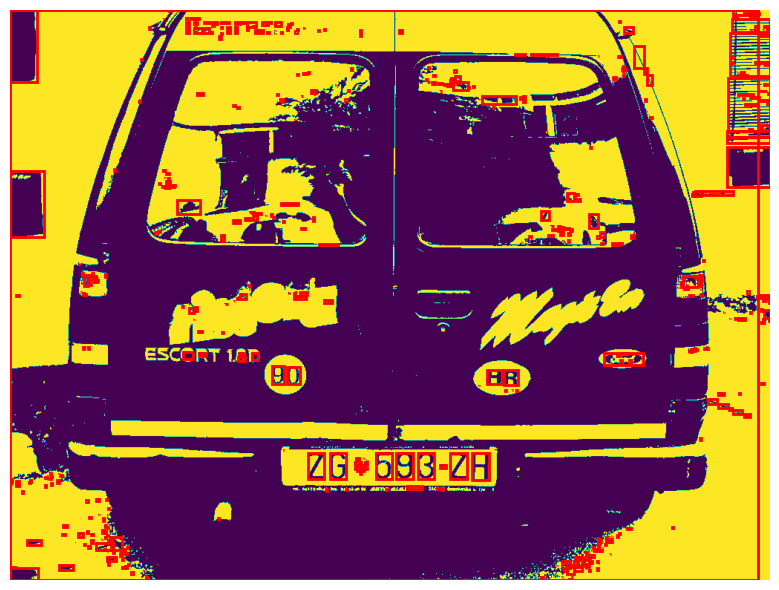

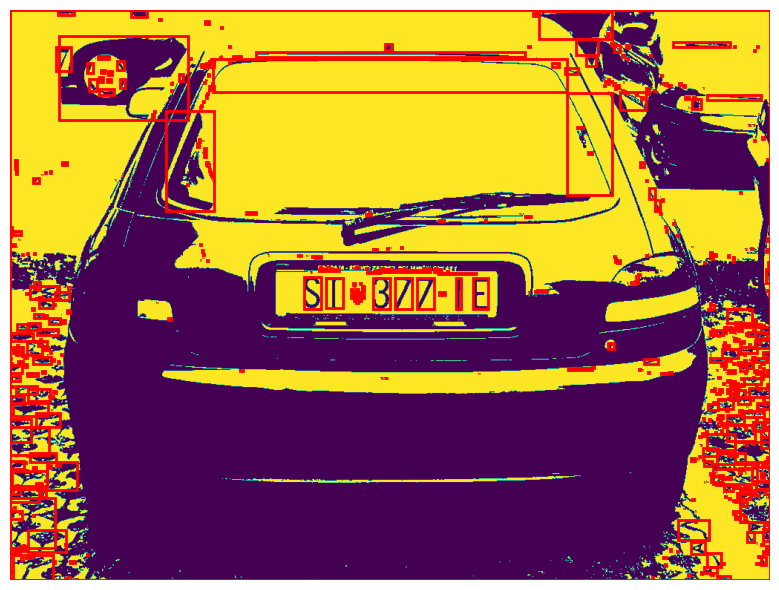

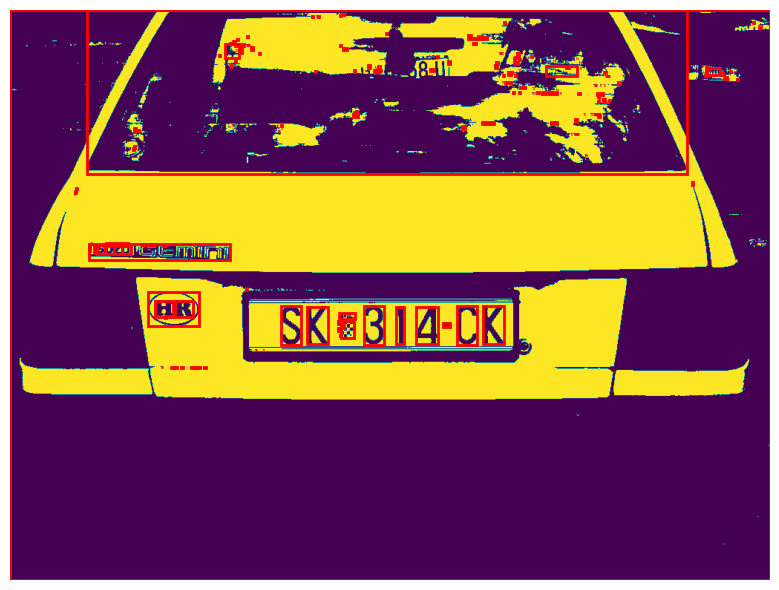

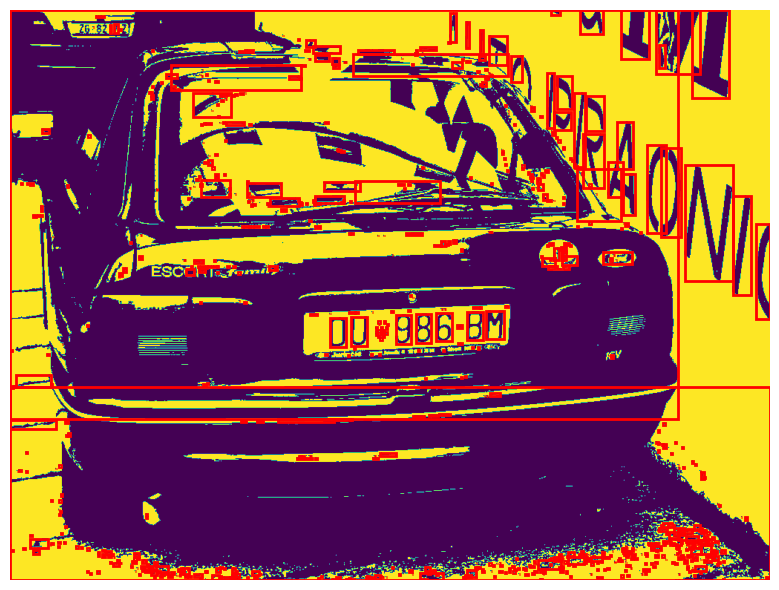

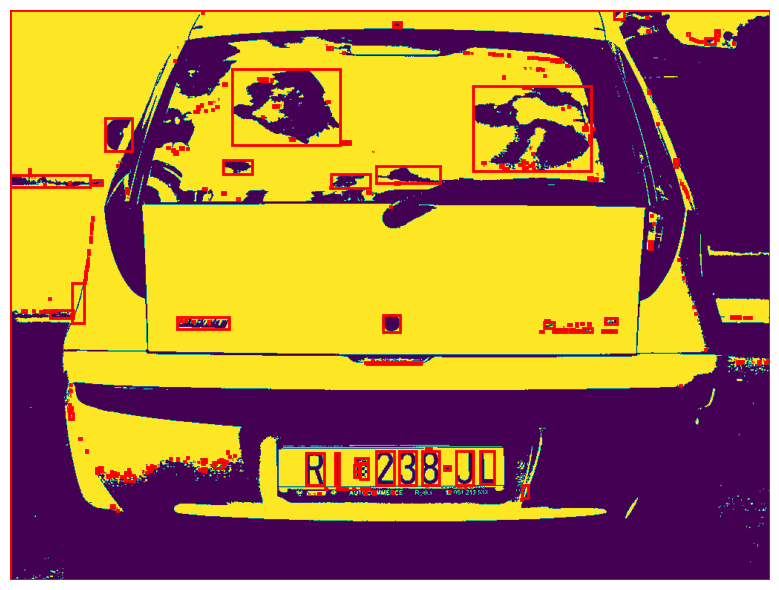

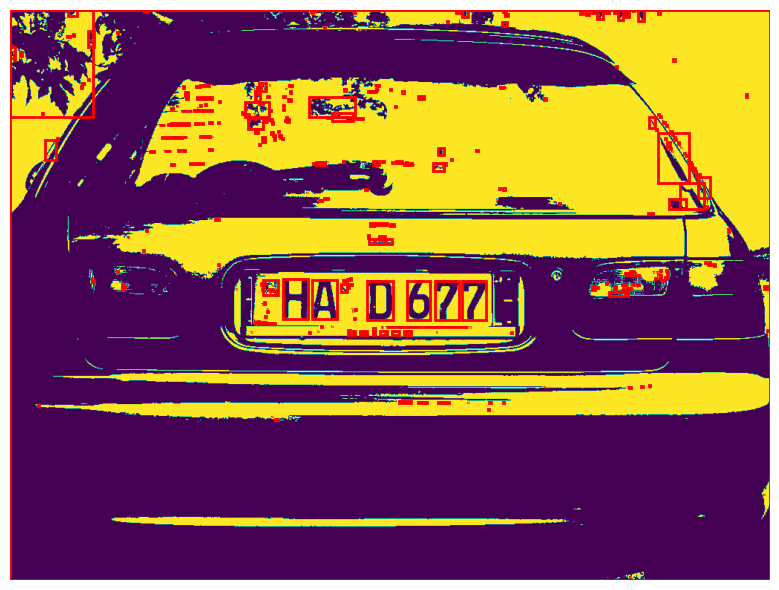

In [19]:
dataset_rois = extraccion_de_rois(dataset_mono, debug=True)

## ROI Filtering

As you can see in the ROI results, there are many false positives. Filter them in a way that minimizes false ROIs while retaining true ones.

Use the filter_rois function to filter out ROIs that are outside of a minimum and maximum area.

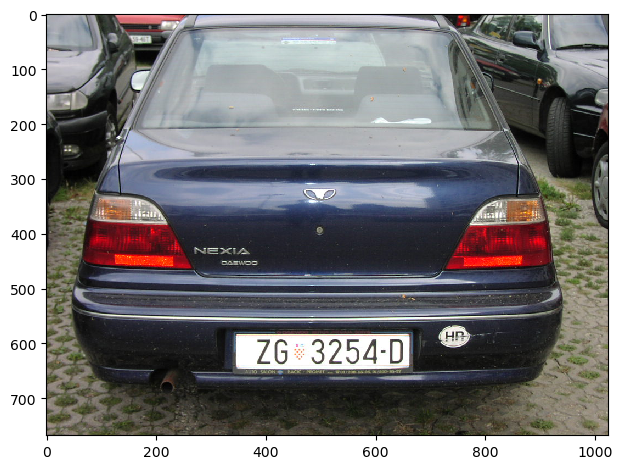

In [20]:
io.imshow(dataset_rgb[0])

In [126]:
def filtrar_rois(rois, area_min=150, area_max = 1200, y_min=320, y_max=700, x_min=250, x_max=800):

    rois_filtered = []
    
    for roi in rois:
        if (area_min <= roi.area <= area_max) and (y_min < roi.centroid[0] < y_max) and (x_min < roi.centroid[1] < x_max):
            rois_filtered.append(roi)
        
            
    return rois_filtered

In [2]:
def filtrar_por_centroides(rois, threshold_pct=3):
    """ Filter ROIs based on allowable deviation from the 50th percentile
      of the y-coordinate of their centroids. """
    
    valores_y = [roi.centroid[0] for roi in rois]  # Extract the y-coordinate of the centroid
    valor_medio = np.percentile(valores_y, 50)  # Calculate the 50th percentile
    umbral = valor_medio * (threshold_pct / 100.0)  # Calculate the allowable deviation threshold

    return [roi for roi in rois if abs(roi.centroid[0] - valor_medio) <= umbral]


In [128]:
def ordenar_por_centroides_x(rois):
    """Short the ROIS"""

    rois_sorted = sorted(rois, key=lambda roi: roi.centroid[1])
    
    return rois_sorted

In [129]:
def limpiar_rois(dataset_rois, imgs, debug=True):
    """
    Receives a list with the ROIs of each frame alongside a list of frames.
    Filters and optionally displays the ROIs overlaid on the image.

    Args:
    dataset_rois (list): List of lists of ROIs for each image.
    imgs (list): List of images corresponding to the ROIs.
    debug (bool): If True, displays the images with overlaid ROIs.

    Returns:
    list: List of lists of filtered ROIs for each image.
    """

    out = []
    
    for rois, img in zip(dataset_rois, imgs):
        
        filtered_rois = filtrar_rois(rois)
        
        filtered_rois = filtrar_por_centroides(filtered_rois)
        
        sorted_rois = ordenar_por_centroides_x(filtered_rois)

        out.append(sorted_rois)
        
        if debug:
            
            mostrar_rois(img.copy(), sorted_rois)
    
    return out

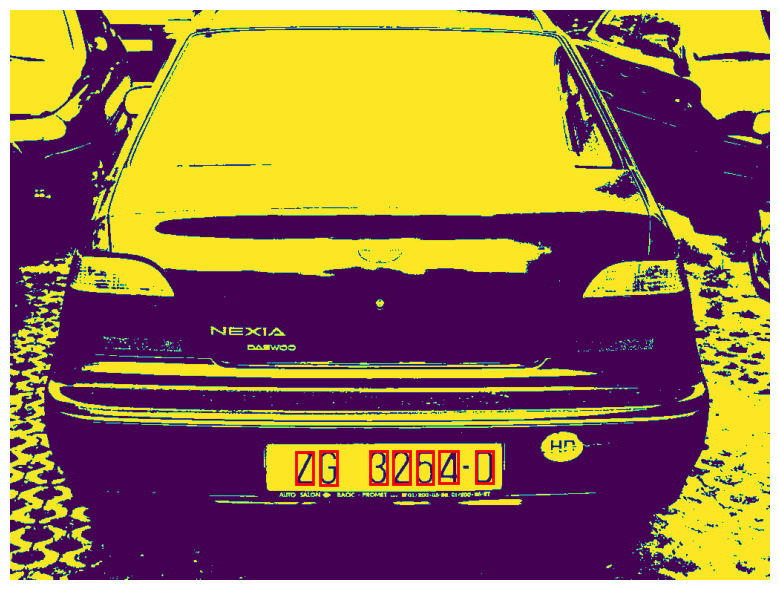

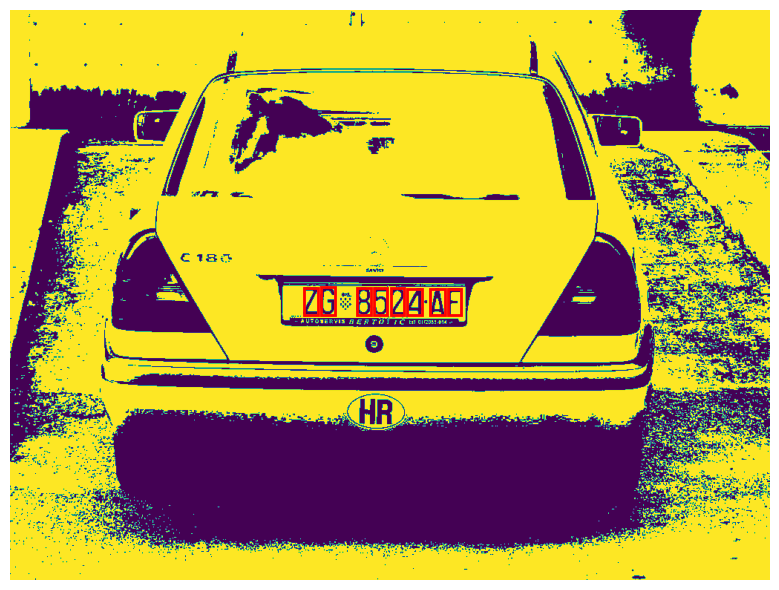

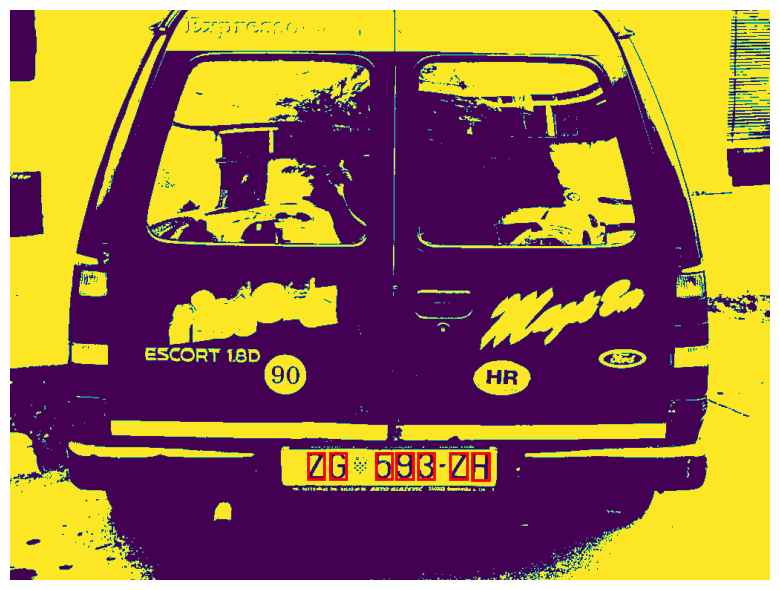

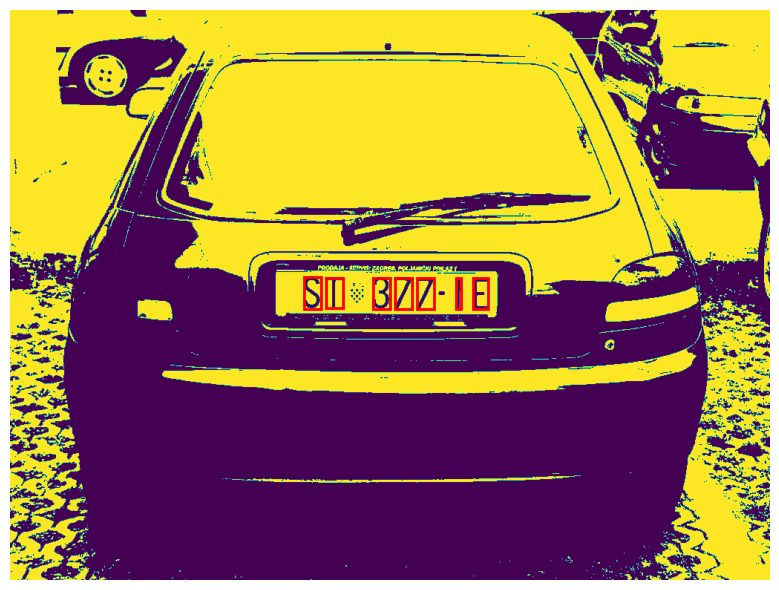

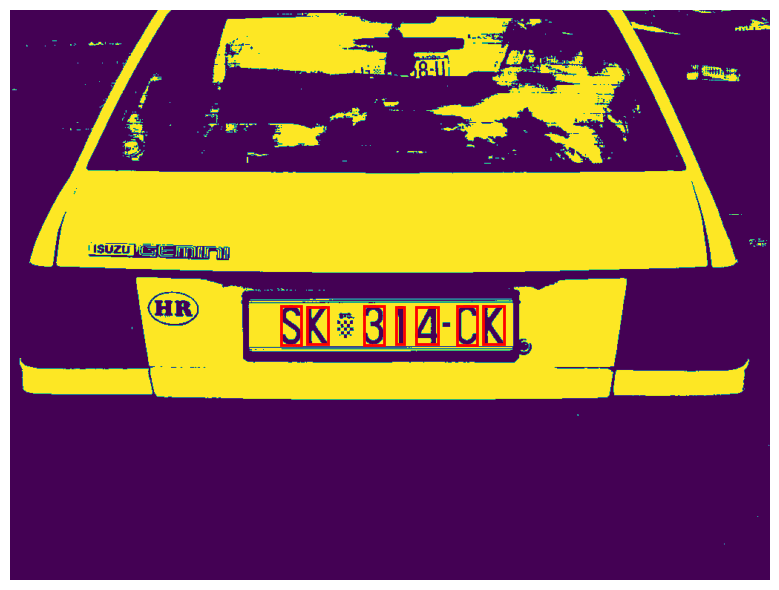

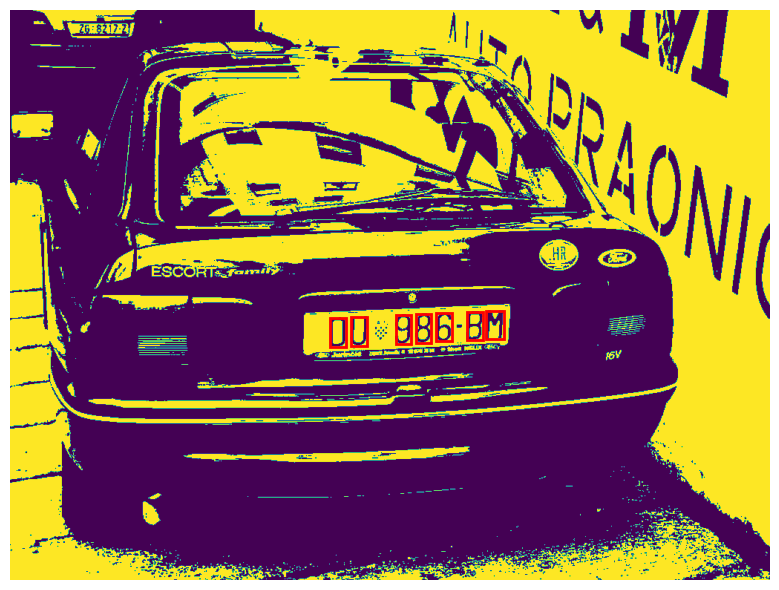

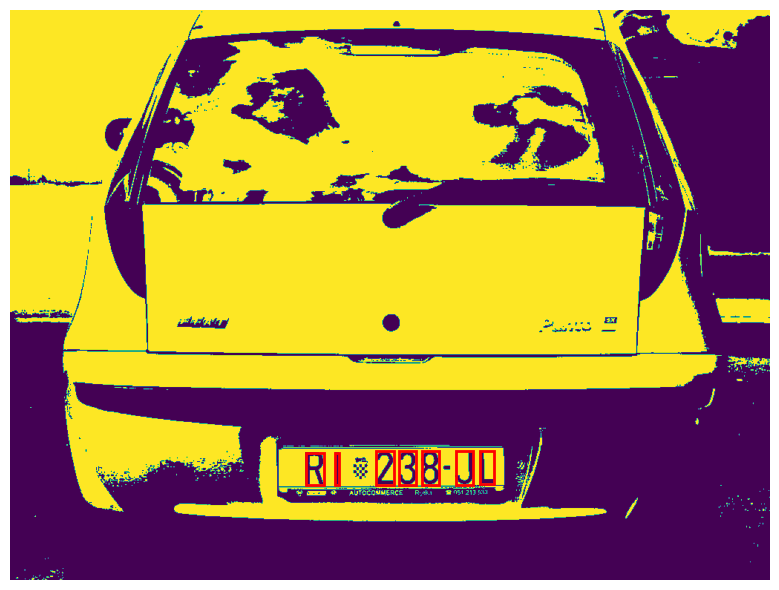

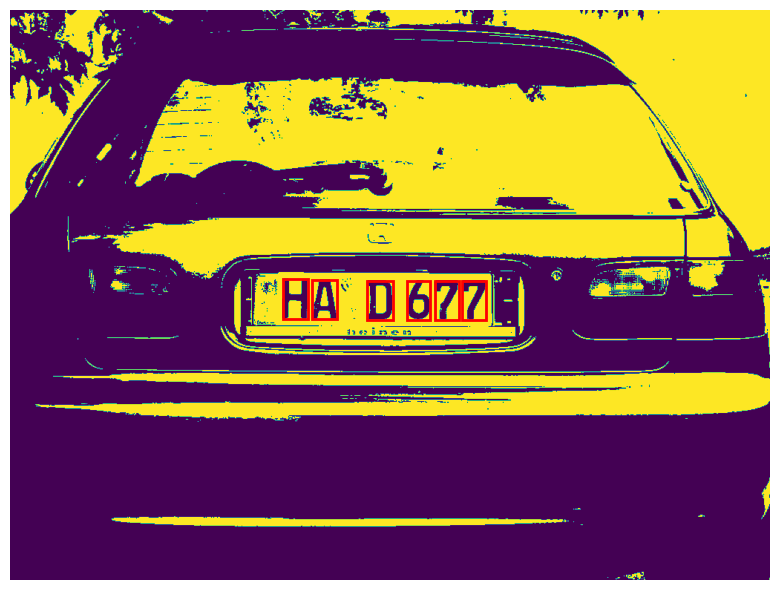

In [130]:
dataset_rois_filtered = limpiar_rois(dataset_rois, dataset_mono, debug=True)

### Model Training
Once the image has been segmented, we will classify the obtained ROIs. To do this, we will generate a dataset and load it:

In [131]:
genera_dataset("corpus", fonts_folder="fonts")

In [132]:
X, y, clases = carga_dataset("corpus") 

{54: '0', 55: '1', 56: '2', 57: '3', 58: '4', 59: '5', 60: '6', 61: '7', 62: '8', 63: '9', 27: 'A', 28: 'B', 29: 'C', 30: 'D', 31: 'E', 32: 'F', 33: 'G', 34: 'H', 35: 'I', 36: 'J', 37: 'K', 38: 'L', 39: 'M', 40: 'N', 42: 'O', 43: 'P', 44: 'Q', 45: 'R', 46: 'S', 47: 'T', 48: 'U', 49: 'V', 50: 'W', 51: 'X', 52: 'Y', 53: 'Z', 0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g', 7: 'h', 8: 'i', 9: 'j', 10: 'k', 11: 'l', 12: 'm', 13: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 41: 'Ñ', 14: 'ñ'}
Cargadas 4800 instancias con 64 atributos. Clases 64.


In [133]:
from sklearn.model_selection import train_test_split

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [172]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Define the model
model = Sequential([
    Dense(64, activation='relu', input_shape=(X.shape[1],)),
    Dropout(0.4),
    Dense(64, activation='softmax')  
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [173]:
# Fit the model
model.fit(
    X_train,  
    y_train,           
    epochs=30,        
    validation_split=0.2
)



Epoch 1/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0270 - loss: 4.1741 - val_accuracy: 0.1280 - val_loss: 3.8295
Epoch 2/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1513 - loss: 3.6939 - val_accuracy: 0.3616 - val_loss: 3.2525
Epoch 3/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2343 - loss: 3.1632 - val_accuracy: 0.6190 - val_loss: 2.6246
Epoch 4/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3821 - loss: 2.6105 - val_accuracy: 0.7202 - val_loss: 2.1104
Epoch 5/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4688 - loss: 2.2102 - val_accuracy: 0.8021 - val_loss: 1.6889
Epoch 6/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5506 - loss: 1.8854 - val_accuracy: 0.8318 - val_loss: 1.3948
Epoch 7/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5942 - loss: 1.6303 - val_accuracy: 0.8482 - val_loss: 1.1679
Epoch 8/30
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6485 - loss: 1.4123 - val_accuracy: 0.8616 - val_loss:

### Evaluation
Finally, evaluate the obtained ROIs using the trained model, leveraging the recognize_roi function that recognizes a specific ROI:

In [179]:
def reconoce_roi(img, roi, model, classes, debug=False):
    """Recognizes a region of interest, returns the class index and the actual letter."""
    top, left, bottom, right = roi.bbox

    window = extraer_ventana(img, left, top, right - left, bottom - top)
    
    if debug:
        print("Original:")
        #io.imshow(window)
        #io.show()
    
    window_resized = transform.resize(window, (8, 8))
    
    if debug:
        print("Preprocessed:")
        io.imshow(window_resized)
        io.show()
    
    y_predicted_filtered = np.argmax(model.predict(window_resized.reshape(1, 64)))
    letter = classes[y_predicted_filtered]
    
    if debug:
        print("Predicted Class: {}\n\n".format(letter))
        
    return letter, y_predicted_filtered


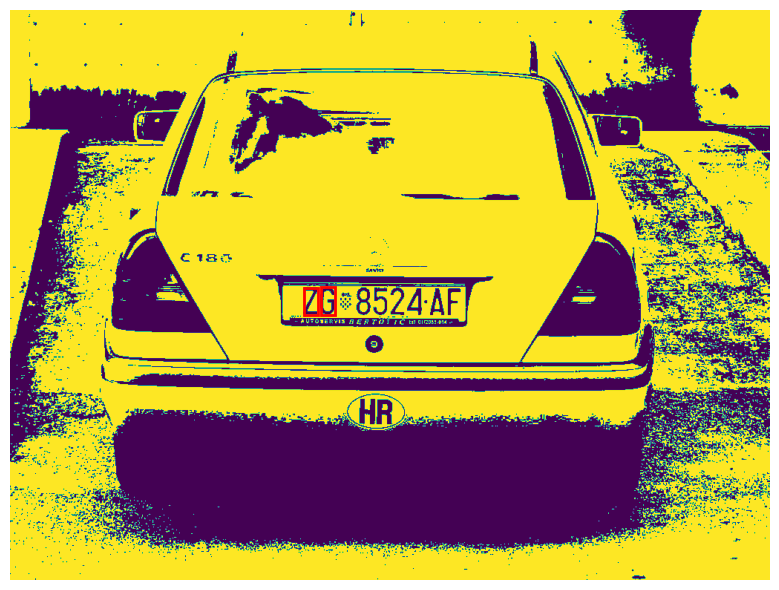

In [180]:
mostrar_rois(dataset_mono[1], dataset_rois_filtered[1][:2])

In [3]:
def reconoce_imgs(imgs_gris, imgs_rgb, dataset_rois, model, clases):
    """Receives a list of grayscale images, their corresponding RGB images, and their ROIs, classifies them,
    and displays the results."""



    
    matriculas = []
    for i in range(len(imgs_gris)):
        matricula = []
        for j in range(len(dataset_rois[i])):
            caracter, _ = reconoce_roi(dataset_gris[i], dataset_rois[i][j], model, clases=clases, debug=False)
            matricula.append(caracter)
            print(matricula)

        matriculas.append(''.join(matricula))
        print(matriculas)



In [182]:
reconoce_imgs(dataset_gris, dataset_rgb, dataset_rois_filtered, model, clases)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
['Z']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
['Z', 'G']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
['Z', 'G', '3']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
['Z', 'G', '3', 'Z']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
['Z', 'G', '3', 'Z', '5']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
['Z', 'G', '3', 'Z', '5', '4']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
['Z', 'G', '3', 'Z', '5', '4', 'G']
['ZG3Z54G']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
['Z']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
['Z', 'G']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
['Z', 'G', '8']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
['Z', 'G', '8', '5']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
['Z', 'G', '8', '5', '2']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
['Z', 'G', '8', '5', '2', '4']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
['Z', 'G', '8', '5', '2', '4', 'A']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
['Z', 'G', '8', '5', '2', '4', 'A', 'F']
['ZG3Z54G', 'ZG8524AF']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
['Z']
1/1 ━━━━━━━━━━━━

### Conclusions

How would you improve the algorithm?

It would be interesting to train the model using images specifically obtained from license plates. This could potentially lead to an even better fit.